### Import libraries 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.metrics import f1_score
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.pipeline import Pipeline
warnings.filterwarnings('ignore')


### Read Dataframe 

In [40]:
df = pd.read_csv("https://raw.githubusercontent.com/AnasElbattra/News-Understanding-NLP/main/Static_dataset.csv")
df

,timestamp,FQDN_count,subdomain_length,upper,lower,numeric,entropy,special,labels,labels_max,labels_average,longest_word,sld,len,subdomain,Target Attack
0,56:19.8,27,10,0,10,11,2.570417,6,6,7,3.666667,2,192,14,1,1
1,07:23.9,27,10,0,10,11,2.767195,6,6,7,3.666667,2,192,14,1,1
2,23:15.1,26,9,0,10,10,2.742338,6,6,7,3.500000,2,192,13,1,0
3,04:51.9,27,10,0,10,11,2.570417,6,6,7,3.666667,2,192,14,1,1
4,12:44.0,15,9,0,11,0,2.929439,4,3,5,4.333333,local,local,15,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268069,33:51.5,18,3,0,16,0,2.338623,2,3,10,5.333333,alma,almaalomah,14,1,0
268070,36:02.5,27,10,0,10,11,2.767195,6,6,7,3.666667,2,192,14,1,0
268071,37:21.5,27,10,0,10,11,2.767195,6,6,7,3.666667,2,192,14,1,1
268072,24:25.1,16,0,0,14,0,3.249687,2,2,13,7.500000,radio,radio-vintage,14,0,0


### Remove duplicate rows and drop missing values (NaN) from the DataFrame

In [41]:
df.drop_duplicates(inplace=True)
df = df.dropna()

### Drop the "timestamp" column from the DataFrame


In [42]:
df.drop("timestamp",axis=1,inplace=True)

### Apply the hash function to the 'longest_word' and 'sld' columns in the DataFrame


In [43]:
df['longest_word'] = df['longest_word'].apply(hash)
df['sld'] = df['sld'].apply(hash)

### Create a subplot with histograms for each DataFrame column using Plotly

In [46]:
import math
import plotly.graph_objects as go
from plotly.subplots import make_subplots

columns_per_row = 5
total_columns = len(df.columns)
total_rows = math.ceil(total_columns / columns_per_row)

# Set vertical_spacing to a smaller value to decrease row margins
fig = make_subplots(rows=total_rows, cols=columns_per_row, subplot_titles=df.columns, vertical_spacing=0.05)

for index, column in enumerate(df.columns):
    row = index // columns_per_row + 1
    col = index % columns_per_row + 1
    fig.add_trace(
        go.Histogram(x=df[column], nbinsx=30, name=column),
        row=row,
        col=col
    )

fig.update_layout(height=300*total_rows, width=1200, title_text="Histograms of DataFrame columns")
fig.show()

### Create a count plot for the 'Target Attack' column and display value counts to check data balance


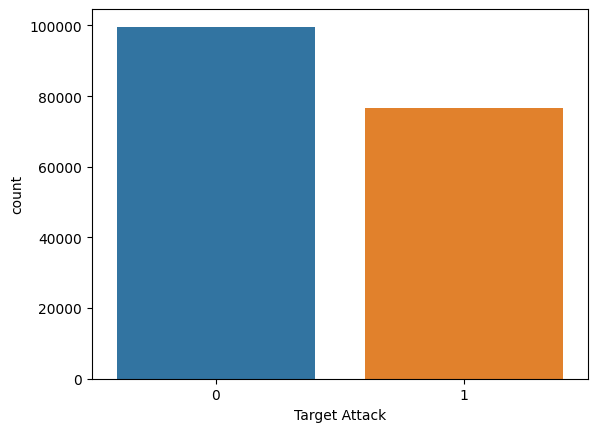

Target Attack
0    99650
1    76613
Name: count, dtype: int64


In [7]:
sns.countplot(x='Target Attack', data=df)
plt.show()
print(df['Target Attack'].value_counts())

### Create subplots with histograms for each DataFrame column using seaborn and matplotlib


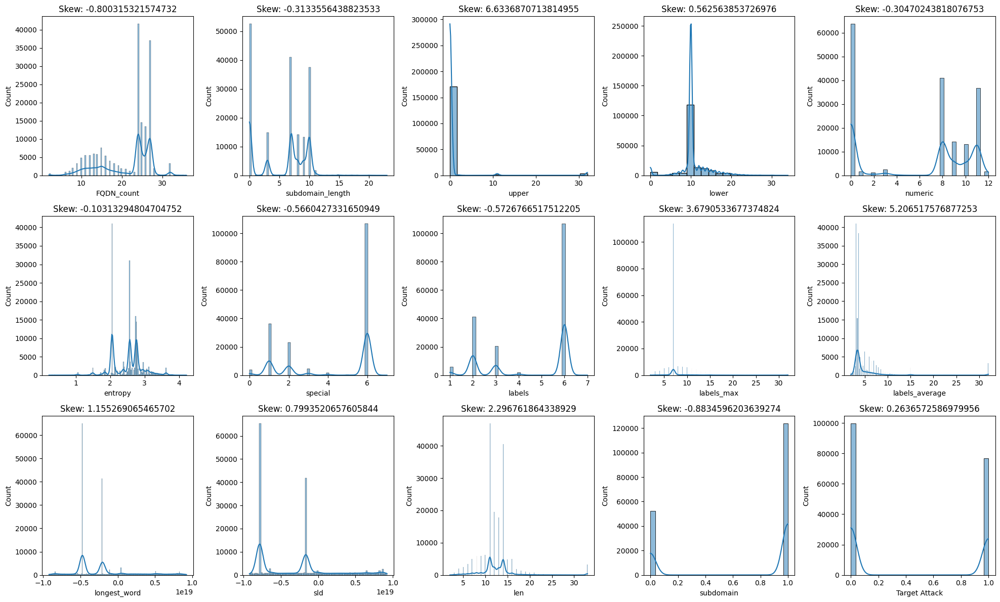

In [47]:
import math
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the number of rows and columns for the subplot grid
columns_per_row = 5
total_columns = len(df.columns)
total_rows = math.ceil(total_columns / columns_per_row)

# Create a figure and axes array
fig, axs = plt.subplots(total_rows, columns_per_row, figsize=(20, 4 * total_rows))

# Flatten the axes array and remove unused subplots
axs = axs.ravel()
for ax in axs[total_columns:]:
    fig.delaxes(ax)

# Iterate over each column and plot
for ax, col in zip(axs, df.columns):
    sns.histplot(df[col], kde=True, ax=ax)  # Use histplot instead of deprecated distplot
    ax.set_title('Skew: ' + str(df[col].skew()))

plt.tight_layout()
plt.show()

### Feature selection using sklearn's SelectKBest and visualization with seaborn and matplotlib


In [11]:
from sklearn.feature_selection import f_classif, SelectKBest, mutual_info_classif, chi2
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def select_features(X, y, method="f_classif", k=6):
    # Select method
    if method == "f_classif":
        bestfeatures = SelectKBest(score_func=f_classif, k=k)
    elif method == "mutual_info":
        bestfeatures = SelectKBest(score_func=mutual_info_classif, k=k)

    fit = bestfeatures.fit(X, y)
    features = fit.transform(X)
    dfscores = pd.DataFrame(fit.scores_)
    dfcolumns = pd.DataFrame(X.columns)

    # Combine scores and column names 
    featureScores = pd.concat([dfcolumns, dfscores], axis=1)
    featureScores.columns = ['Specs', 'Score']

    print("Top ", k, " ", method, " features: \n", featureScores.nlargest(k, 'Score'))

    # Visualization
    best_features = featureScores.nlargest(k, 'Score')
    plt.figure(figsize=(20, 5))
    sns.barplot(x='Specs', y='Score', data=best_features)
    plt.box(False)
    plt.title('Top ' + str(k) + ' ' + method + ' features', fontsize=16)
    plt.xlabel('\nFeatures', fontsize=14)
    plt.ylabel('Score', fontsize=14)
    plt.xticks(rotation=45, fontsize=12)
    plt.show()

    # Convert features to DataFrame
    selected_columns = best_features["Specs"].values.tolist()
    features_df = pd.DataFrame(features, columns=selected_columns)

    return features_df, selected_columns

In [12]:
X = df.drop(['Target Attack'], axis=1)
y = df['Target Attack']

### Perform feature selection using f_classif method


Top  6   f_classif  features: 
                Specs         Score
4            numeric  87389.445842
6            special  78960.533812
1   subdomain_length  74797.474537
7             labels  73244.440062
0         FQDN_count  71373.781290
13         subdomain  48238.416671


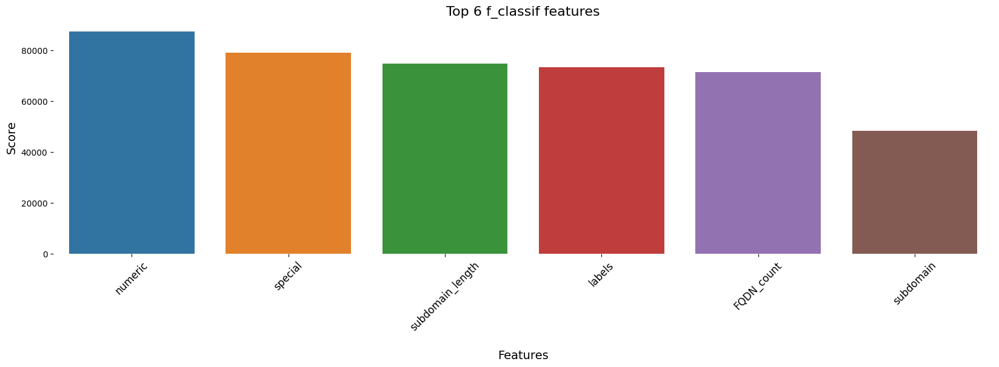

In [13]:
features_f_classif,f_classif_cols= select_features(X, y, method="f_classif")

### Perform feature selection using mutual_info method


Top  6   mutual_info  features: 
            Specs     Score
11           sld  0.281221
10  longest_word  0.279138
7         labels  0.264632
6        special  0.253041
5        entropy  0.250384
0     FQDN_count  0.238583


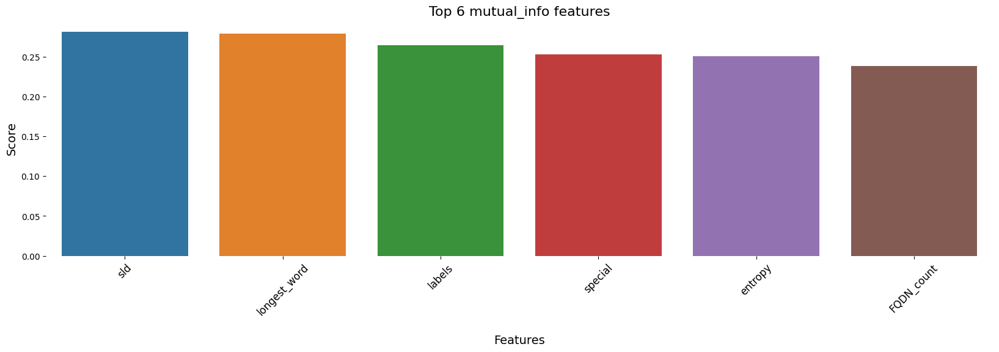

In [14]:
features_mutual,mutal_cols = select_features(X, y, method="mutual_info")

In [15]:
column_names = ["FQDN_count", "subdomain_length", "upper", "lower", "numeric", 
                    "entropy", "special", "labels", "labels_max", "labels_average",
                    "longest_word", "sld", "len", "subdomain"]

### Preprocess data using MinMaxScaler and split into training and testing sets


In [ ]:
scaler = MinMaxScaler()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
x_train = scaler.fit_transform(X_train)
x_test = scaler.transform(X_test)
x_train_df = pd.DataFrame(x_train, columns=X.columns)
x_test_df = pd.DataFrame(x_test, columns=X.columns)

### Train a model using a specified set of columns and a RandomForestClassifier as an initial model 


In [16]:

def train_model(cols=column_names, model=RandomForestClassifier(n_estimators=100, random_state=42)):
    pipeline = Pipeline([
        ('scaler', scaler),
        ('model', model)
    ])

    pipeline.fit(X_train[cols], y_train)

    # Make predictions
    y_pred = pipeline.predict(X_test[cols])

    # Calculate F1 score and print it
    f1 = f1_score(y_test, y_pred, average='weighted')  
    print('F1 Score:', f1)

    return pipeline,f1

### Train the baseline model using the specified set of columns and a RandomForestClassifier


In [18]:
base_line_model,f1_forest = train_model()

F1 Score: 0.7840656481430824


### Train a model using a specified set of columns and a RandomForestClassifier with mutual_info feature selection

In [19]:
mutual_rforest,f1_forest_mutual = train_model(mutal_cols)

F1 Score: 0.7841087916682713


### Train a model using a specified set of columns and a RandomForestClassifier with f_classif feature selection

In [20]:
f_classif_rforest,f1_forest_classif = train_model(f_classif_cols) 

F1 Score: 0.7834318129812767


### Train the baseline model using the specified set of columns and a XGBClassifier


In [21]:
import xgboost as xgb
base_line_xgb,f1_xgp= train_model(model=xgb.XGBClassifier(random_state=42))

F1 Score: 0.7840907479810688


### Train a model using a specified set of columns and a XGBClassifier with f_classif feature selection

In [22]:
f_classif_xgp,f1_xgp_classif =train_model(f_classif_cols,xgb.XGBClassifier(random_state=42))

F1 Score: 0.7835180683564377


### Train a model using a specified set of columns and a XGBClassifier with mutual_info feature selection

In [23]:
mutul_xgp,f1_xgp_mutual =train_model(mutal_cols,xgb.XGBClassifier(random_state=42))

F1 Score: 0.7840907479810688


### Compare F1 scores of different models using a bar chart


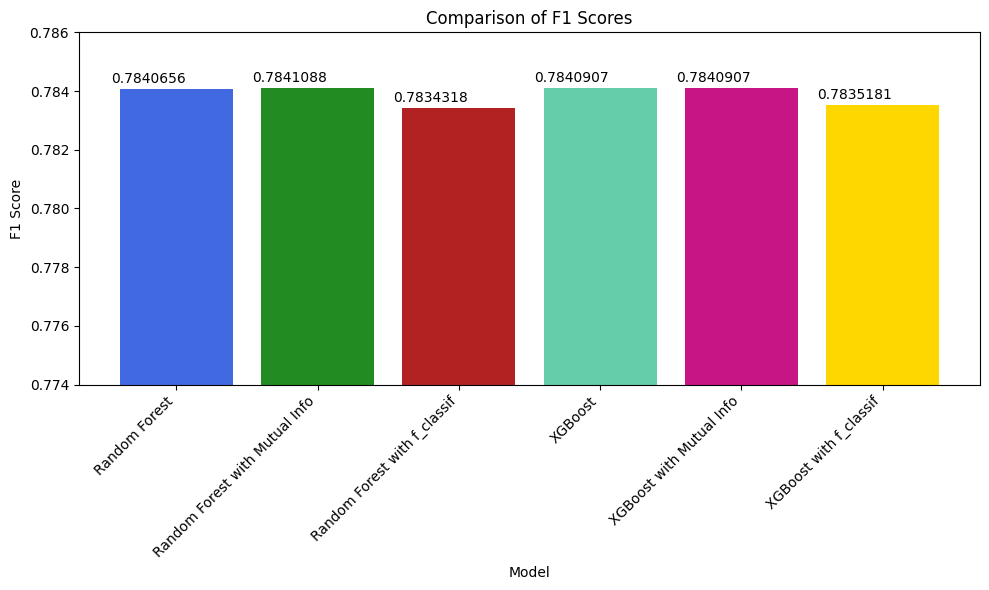

In [24]:
import matplotlib.pyplot as plt

f1_scores = [f1_forest, f1_forest_mutual, f1_forest_classif, f1_xgp, f1_xgp_mutual, f1_xgp_classif]
labels = ['Random Forest', 'Random Forest with Mutual Info', 'Random Forest with f_classif',
          'XGBoost', 'XGBoost with Mutual Info', 'XGBoost with f_classif']

colors = ['royalblue', 'forestgreen', 'firebrick', 'mediumaquamarine', 'mediumvioletred', 'gold']

plt.figure(figsize=(10, 6))

bars = plt.bar(labels, f1_scores, color=colors)

plt.xlabel('Model')
plt.ylabel('F1 Score')
plt.title('Comparison of F1 Scores')

plt.xticks(rotation=45, ha='right')
plt.ylim(0.774, .786)

# Adding data labels on top of each bar
for bar, f1_score in zip(bars, f1_scores):
    plt.text(bar.get_x() + bar.get_width() / 2 - 0.2, bar.get_height() + 0.0001, f'{f1_score:.7f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()


### Perform GridSearchCV to find the best parameters for the XGB model with mutual_info 


In [26]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'model__n_estimators': [100, 200],
    'model__max_depth': [None, 10],
    'model__min_samples_split': [2, 5],
    'model__min_samples_leaf': [1, 2],
}
grid_search = GridSearchCV(mutul_xgp, param_grid, cv=5,scoring='f1')
grid_search.fit(X_train[mutal_cols], y_train)

best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

print("Best Model:", best_model)
print("Best Parameters:", best_params)



Best Model: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, min_samples_leaf=1,
                               min_samples_split=2, missing=nan

### Save the model in pickel file 

In [33]:
import pickle

with open('xgp_mutual.pkl', 'wb') as file:
    pickle.dump(best_model, file)